<a href="https://colab.research.google.com/github/sayakpaul/A-B-testing-with-Machine-Learning/blob/master/MIRNet_TRT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This notebook shows the TensorRT model conversion and inference processes for the **MIRNet** model as proposed by [Learning Enriched Features for Real Image Restoration and Enhancement](https://arxiv.org/pdf/2003.06792v2.pdf). This model is capable of enhancing low-light images upto a great extent. 

<p align="center">
<img src="https://github.com/soumik12345/MIRNet/raw/master/assets/lol_results.gif"</img><br>
<small><a href="https://github.com/soumik12345/MIRNet/blob/master/assets/lol_results.gif">Source</a></small>
</p>

Model training code and pre-trained weights are provided by **Soumik** through [this repository](https://github.com/soumik12345/MIRNet/). 

## Initial setup

In [1]:
# Which GPU?
!nvidia-smi

Fri Dec 18 07:09:19 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.45.01    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   46C    P8     9W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!git clone https://github.com/soumik12345/MIRNet
%cd MIRNet

Cloning into 'MIRNet'...
remote: Enumerating objects: 213, done.
remote: Counting objects: 100% (213/213), done.
remote: Compressing objects: 100% (164/164), done.
remote: Total 213 (delta 94), reused 148 (delta 40), pack-reused 0
Receiving objects: 100% (213/213), 28.12 MiB | 17.64 MiB/s, done.
Resolving deltas: 100% (94/94), done.
/content/MIRNet


In [3]:
!pip install -q wandb

     |████████████████████████████████| 1.8MB 8.0MB/s 
     |████████████████████████████████| 133kB 31.0MB/s 
     |████████████████████████████████| 102kB 11.6MB/s 
     |████████████████████████████████| 102kB 9.3MB/s 
     |████████████████████████████████| 163kB 24.7MB/s 
     |████████████████████████████████| 71kB 10.1MB/s 


In [4]:
from glob import glob
from PIL import Image
from matplotlib import pyplot as plt
from mirnet.inference import Inferer
from mirnet.utils import download_dataset, plot_result
from tensorflow.python.compiler.tensorrt import trt_convert as trt

import tensorflow as tf
import numpy as np
import time
print(tf.__version__)

2.4.0


## Download dataset and pre-trained weights

In [5]:
download_dataset('LOL')

Downloading...
From: https://drive.google.com/uc?id=157bjO1_cFuSd0HWDUuAmcHRJDVyWpOxB
To: /content/MIRNet/LOLdataset.zip
347MB [00:01, 208MB/s]


Unpacking Dataset
Done!!!


In [6]:
inferer = Inferer()
inferer.download_weights('1sUlRD5MTRKKGxtqyYDpTv7T3jOW6aVAL')
inferer.build_model(
    num_rrg=3, num_mrb=2, channels=64,
    weights_path='low_light_weights_best.h5'
)

Downloading...
From: https://drive.google.com/uc?id=1sUlRD5MTRKKGxtqyYDpTv7T3jOW6aVAL
To: /content/MIRNet/low_light_weights_best.h5
148MB [00:01, 131MB/s] 


In [7]:
# Save model in SavedModel format
inferer.model.save('mirnet_saved_model')

INFO:tensorflow:Assets written to: mirnet_saved_model/assets


## TensorRT model conversion

In [8]:
# Specify the conversion parameters
params = trt.DEFAULT_TRT_CONVERSION_PARAMS._replace(
    precision_mode='FP16',
    is_dynamic_op=True)

# Convert the model
converter = trt.TrtGraphConverterV2(
      input_saved_model_dir='mirnet_saved_model',
      conversion_params=params)
converter.convert()

# Save the model
converter.save('mirnet_trt')

INFO:tensorflow:Linked TensorRT version: (0, 0, 0)
INFO:tensorflow:Loaded TensorRT version: (0, 0, 0)
INFO:tensorflow:Assets written to: mirnet_trt/assets


You can follow [this blog post](https://sayak.dev/tf.keras/tensorrt/tensorflow/2020/07/01/accelerated-inference-trt.html) to review some of the parameters used in the above code snippet. 

## Utility functions

In [9]:
# Load up a few image for running inference and specify the image dimensions
LOW_LIGHT_IMGS = glob('./eval15/low/*')[:10]
IMG_WIDTH, IMG_HEIGHT = 600, 400

In [10]:
def preprocess_image(image_path):
    original_image = Image.open(image_path)
    preprocessed_image = original_image.resize(
        (
            IMG_WIDTH,
            IMG_HEIGHT
        ),
        Image.ANTIALIAS)
    preprocessed_image = tf.keras.preprocessing.image.img_to_array(preprocessed_image)
    preprocessed_image = preprocessed_image.astype('float32') / 255.0
    preprocessed_image = np.expand_dims(preprocessed_image, axis=0)
    
    return original_image, preprocessed_image

Some parts of the above two functions have been referred from [here](https://github.com/soumik12345/MIRNet/blob/master/mirnet/inference.py). 

## Running inference with the TensorRT-optimized model

In [11]:
# Load up the model
root = tf.saved_model.load('mirnet_trt')
concrete_func = root.signatures['serving_default']

In [12]:
# Warm-up the GPU
for _ in range(100):
    dummy_image = tf.random.normal((1, IMG_HEIGHT, IMG_WIDTH, 3), dtype=tf.float32)
    _ = concrete_func(input_1=dummy_image)["add_171"]
print("GPU warmed up!")

GPU warmed up!


[INFO] predictions took 6.33 seconds


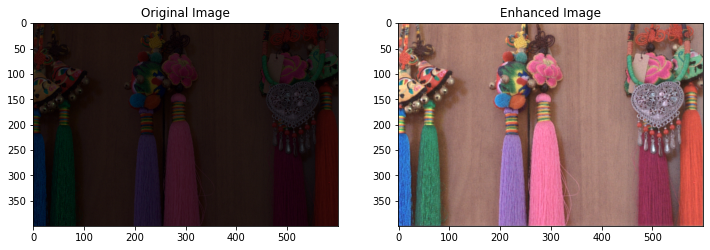

[INFO] predictions took 0.64 seconds


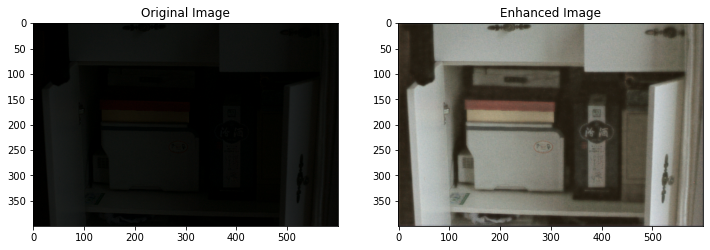

[INFO] predictions took 0.64 seconds


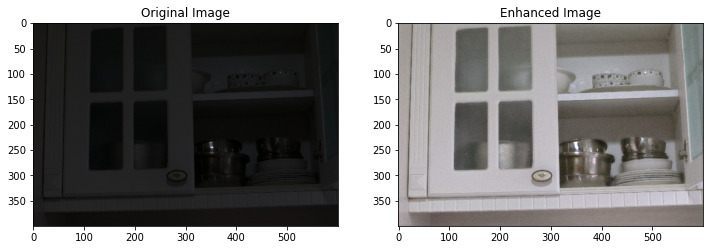

[INFO] predictions took 0.65 seconds


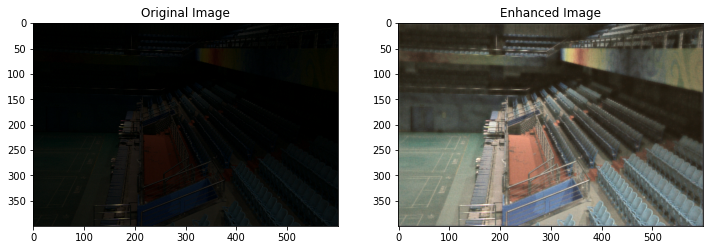

[INFO] predictions took 0.64 seconds


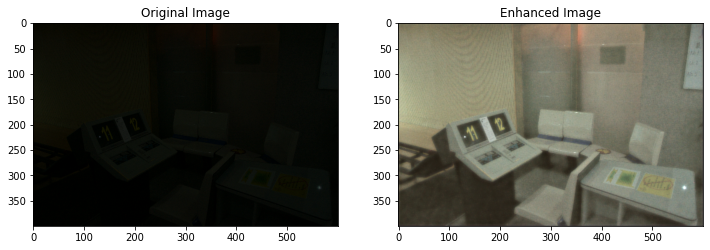

[INFO] predictions took 0.64 seconds


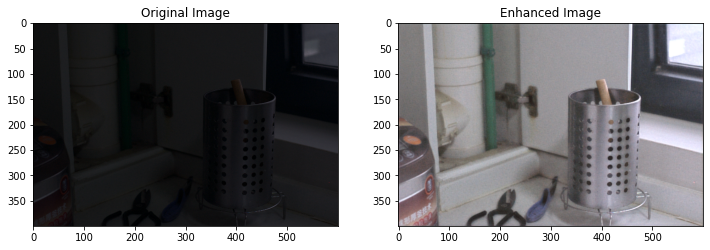

[INFO] predictions took 0.64 seconds


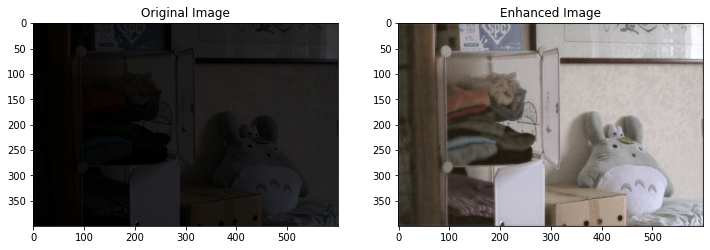

[INFO] predictions took 0.65 seconds


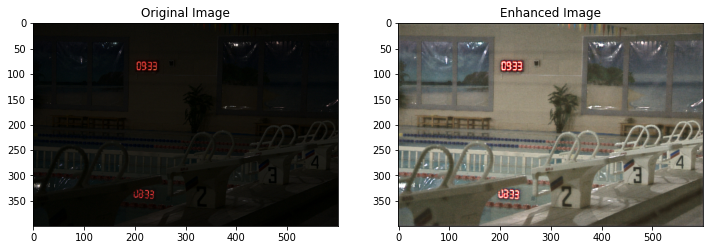

[INFO] predictions took 0.64 seconds


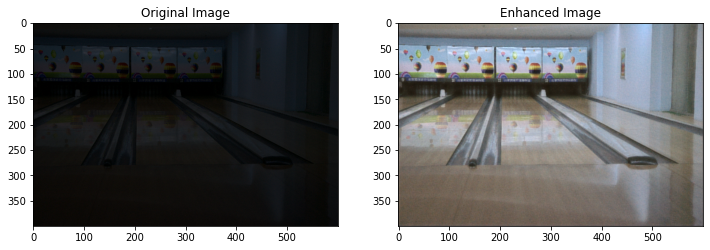

[INFO] predictions took 0.65 seconds


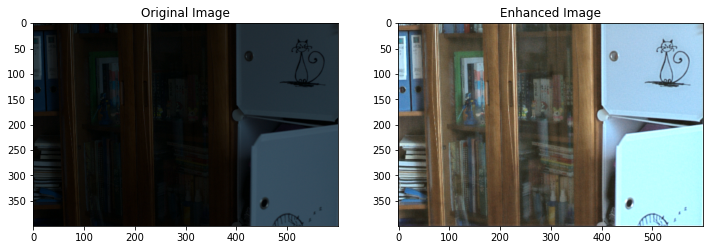

In [13]:
# Loop over the image paths
for image_path in LOW_LIGHT_IMGS:
    # preprocess the current image
    original_image, preprocessed_image = preprocess_image(image_path)

    # Run inference with the model and post-process the prediction
    start_time = time.time()
    output_image = concrete_func(input_1=preprocessed_image)["add_171"]
    total_time = time.time() - start_time
    print("[INFO] predictions took {:.2f} seconds".format(total_time))
    output_image = output_image.numpy().squeeze() * 255.0
    output_image = output_image.clip(0, 255)
    output_image = output_image.squeeze()
    output_image = Image.fromarray(np.uint8(output_image))

    # Plot the results
    fig = plt.figure(figsize=(12, 12))
    fig.add_subplot(1, 2, 1).set_title("Original Image")
    plt.imshow(Image.fromarray(np.uint8(original_image)))
    fig.add_subplot(1, 2, 2).set_title("Enhanced Image")
    plt.imshow(output_image)
    plt.show()

Consider deploying this optimized model to an NVIDIA GPU-enabled device for optimal performance as opposed the models shown in [this notebook](https://colab.research.google.com/github/sayakpaul/MIRNet-TFLite/blob/main/MIRNet_TFLite_Fixed_Shape.ipynb).  

## Performing inference on a low-light video

In [14]:
# Get a low-light video
!wget -q https://storage.googleapis.com/demo-experiments/low_light_video.mp4

In [20]:
# Additional imports
import cv2
import imutils
from imutils.video import FPS

In [28]:
# Preprocessing utility
def preprocess_frame(frame):
    frame = Image.fromarray(frame)
    preprocessed_image = frame.resize(
        (
            IMG_WIDTH,
            IMG_HEIGHT
        ),
        Image.ANTIALIAS)
    preprocessed_image = tf.keras.preprocessing.image.img_to_array(preprocessed_image)
    preprocessed_image = preprocessed_image.astype('float32') / 255.0
    preprocessed_image = np.expand_dims(preprocessed_image, axis=0)
    
    return preprocessed_image

Following code is referred from this blog post: [YOLO object detection with OpenCV](http://pyimg.co/xz3ip) by PyImageSearch.

In [41]:
# Initialize the video input pointer
vs = cv2.VideoCapture("low_light_video.mp4")
writer = None
(W, H) = (None, None)

# Try calculating the total number of frames in the video file
try:
	prop = cv2.cv.CV_CAP_PROP_FRAME_COUNT if imutils.is_cv2() \
		else cv2.CAP_PROP_FRAME_COUNT
	total = int(vs.get(prop))
	print("[INFO] {} total frames in video".format(total))

# Raise an error if the number of frames couldn't be calculated
except:
	print("[INFO] could not determine # of frames in video")
	print("[INFO] no approx. completion time can be provided")
	total = -1

# Start the FPS throughput estimator
fps = FPS().start()

[INFO] 784 total frames in video


In [42]:
# Warm-up the GPU
for _ in range(100):
    dummy_image = tf.random.normal((1, IMG_HEIGHT, IMG_WIDTH, 3), dtype=tf.float32)
    _ = concrete_func(input_1=dummy_image)["add_171"]
print("GPU warmed up!")

GPU warmed up!


In [43]:
#@title Real-time inference (takes time)
# loop over frames from the video file stream
while True:
    # read the next frame from the file
    (grabbed, frame) = vs.read()

    # if the frame was not grabbed, then we have reached the end
    # of the stream
    if not grabbed:
        break

    # preprocess the current input frame and run inference
    preprocessed_frame = preprocess_frame(frame)
    enhanced_frame = concrete_func(input_1=preprocessed_frame)["add_171"]

    # post-process the prediction
    enhanced_frame = enhanced_frame.numpy().squeeze() * 255.0
    enhanced_frame = enhanced_frame.clip(0, 255)
    enhanced_frame = enhanced_frame.squeeze()
    enhanced_frame = np.uint8(enhanced_frame)
    
    # prepare the output frame
    resized_frame = Image.fromarray(frame)
    resized_frame = resized_frame.resize(
        (
            IMG_WIDTH,
            IMG_HEIGHT
        ),
        Image.ANTIALIAS)
    output = np.hstack([np.uint8(resized_frame), enhanced_frame])

    # update the FPS counter
    fps.update()
 
    # check if the video writer is None
    if writer is None:
        # initialize our video writer
        fourcc = cv2.VideoWriter_fourcc(*"MJPG")
        writer = cv2.VideoWriter("output.avi", fourcc, 30,
            (output.shape[1], output.shape[0]), True)

    # write the output frame to disk
    writer.write(output)

# stop the timer and display FPS information
fps.stop()
print("[INFO] elasped time: {:.2f}".format(fps.elapsed()))
print("[INFO] approx. FPS: {:.2f}".format(fps.fps()))

# release the file pointers
print("[INFO] cleaning up...")
writer.release()
vs.release()

[INFO] elasped time: 940.15
[INFO] approx. FPS: 0.83
[INFO] cleaning up...


Our output video is produced in `.avi` format. First, we need to convert it to `.mp4` format. 

In [ ]:
!ffmpeg -i "output.avi" output.mp4

In [45]:
#@title Display video inline
from IPython.display import HTML
from base64 import b64encode

mp4 = open("output.mp4", "rb").read()
dataURL = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % dataURL)

This code is referred from [this StackOverflow thread](https://stackoverflow.com/a/57378660/7636462). 